<a href="https://colab.research.google.com/github/shrikrishnachannawar/Dog_breed_identification_model/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐕 End-to-End multiclass Dog breed Classification

This note book build an end-to-end multiclass image classifier
using TenserFlow 2.0 and TennserFlow Hub

## 1.Problem:

Indentfiying the the breed of a dog given an image of dog.

When I am sitting at the cafe I take a photo of dog I wnat to know
what breed of dog it is.

## 2.Data:

The data we are using is from kaggel's dog breed identification
competition.

https://www.kaggle.com/competitions/dog-breed-identification

## 3.Evalution:

The Evalution is file with prediction probabilities for each
dog breed of each dog image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4.Features:

Some imformation about the data:
* We are dealing with images (unstructured data) so its probably best we use deep learning /transfer leraning.
* There are 120 breeds of dogs (that means there are 120 different classes)
* There are around 10,000+ images in treaning set.
(this images have labels).
* There are around 10,000+ images in test set.(This omages have no labels because we 'll want to predict them)


In [ ]:
#!unzip "drive/MyDrive/dog/dog-breed-identification.zip" -d "drive/MyDrive/dog/"

hgdhgdfddfdfffd

# Get workspace ready

* import the tensorflow 2.x
* import the tensorflow hub
* Make sure we are using GPU

In [ ]:
#import the tools that we gona need
import tensorflow as tf
import tensorflow_hub as  hub
print("version of tensorflow",tf.__version__)
print("version of tensorflow hub",hub.__version__)

#check for GPU availibility
print("GPU", "availabel (yes!)" if tf.config.list_physical_devices("GPU") else "not availabel :(")

version of tensorflow 2.14.0
version of tensorflow hub 0.15.0
GPU availabel (yes!)


## Getting our data ready (Turning into tensor)

with all machine learning models, our data  has has to be in numerical formate.So that's what we will we doing first.Turning our images into tensors (numerical represation).

Let's start by accessing our data and checking out the labels.


In [ ]:
#checkout the label of data
import pandas as pd
label_csv=pd.read_csv("drive/MyDrive/dog/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

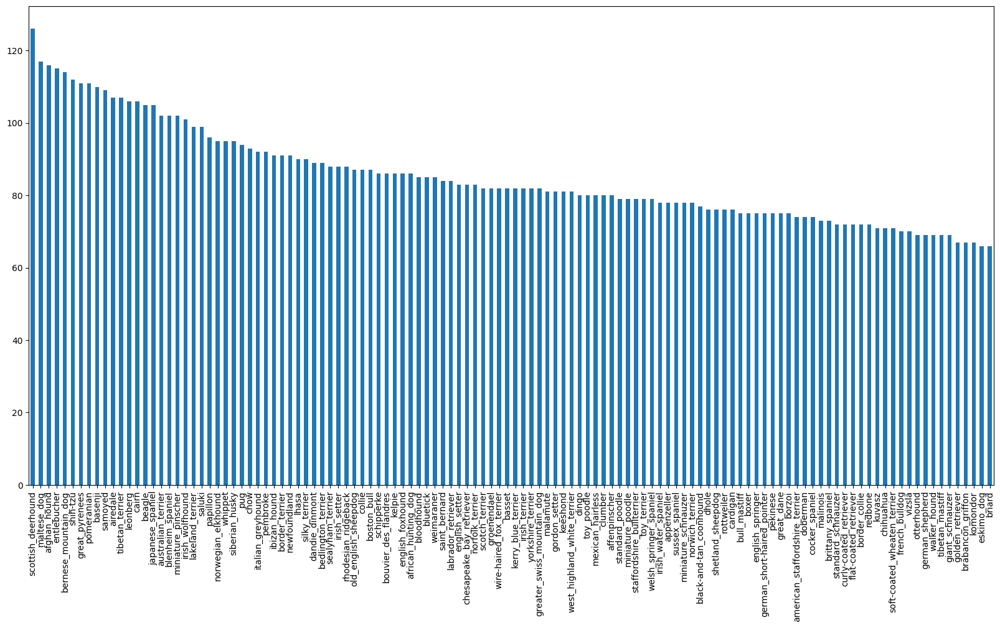

In [ ]:
#how many counts of each breed
label_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
#whats the median no of image pre class
label_csv["breed"].value_counts().median()

82.0

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Data/train/" + fname + ".jpg" for fname in label_csv["id"]]

# Check the first 10 filenames
filenames[:10]

['drive/My Drive/Data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

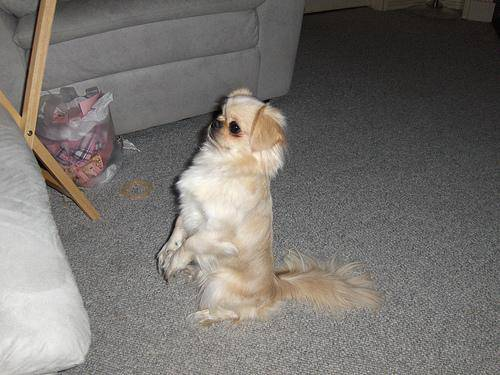

In [ ]:

#Lets view an image
from IPython.display import Image
Image("drive/MyDrive/dog/train/001cdf01b096e06d78e9e5112d419397.jpg")


### Getting image and theri labels

Let's get list  of all of our image file pathnames.

In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create a pathname from images ID's
filenames=[ "drive/MyDrive/dog/train/" + fname +".jpg" for fname in label_csv["id"]]

#checking the first 10
filenames[:100]


['drive/MyDrive/dog/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/dog/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/dog/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/dog/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/dog/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 'drive/MyDrive/dog/train/0075dc49dab4024d12fafe67074d8a81.jpg',
 'drive/MyDrive/dog/train

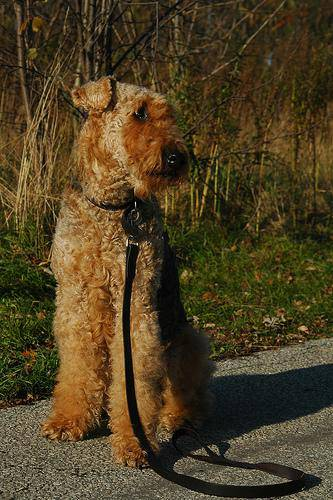

In [ ]:
#one more check
Image(filenames[5000])

In [ ]:
label_csv["breed"][5000]

'airedale'

since we've now got our training images in list ,let's prepare our labels.

In [ ]:
import numpy as np
label=label_csv["breed"].to_numpy()
label

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(label)

10222

In [ ]:
#see the no of labels matches the number of filenames
if len(label)==len(filenames):
  print("Number of labels matches number of filenames!")

else:
  print("it does noy match , check directory")

Number of labels matches number of filenames!


In [ ]:
#find the unique labels values
unique_breeds=np.unique(label)
len(unique_breeds)

120

In [ ]:
#turn single label into an array of booleans
print(label[0])
label[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn every label into a boolean array
boolean_lables=[label == unique_breeds for label in label]
boolean_lables[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Example: Turning boolean array into integers
print(label[0]) #original label
print(np.where(unique_breeds == label[0])[0][0])# index where labels occurs
print(boolean_lables[0].argmax()) # index where label occurs in boolean array
print(boolean_lables[0].astype(int))# there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(label[2])
print(boolean_lables[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/dog/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the data from kaggel dosen't come with validation set,we are going to create our own.

In [ ]:
#setup x and y variable
x=filenames
y=boolean_lables

In [ ]:
len(filenames)

10222

We are going to start off experimenting with ~1000  images and increase as we needed.

In [ ]:
#set no of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider" ,min:1000, max:10000}

In [ ]:
#lets split our data into tarin and validation set.
from sklearn.model_selection import  train_test_split
#split them into traning and validation of total size NUM_IMAGES
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(x_train), len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
#Let's have the geez at the tarining data
x_train[:5],y_train[:2]

(['drive/MyDrive/dog/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False

## Preprocessing Images (turning images into tensors)

To preprocess of images into tensors we are going to write a function which dose few things:
1. Take a image filepath as input.
2. Use the TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a .jpg)  into tensors.
4. Resize the `image` to be a shape of (224,224).
5. Return modified `image`.

In [ ]:
#importing an images
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
#define the image size
IMG_SIZE=224

#create a function for preprocessing the image
def process_img (image_path, img_size=IMG_SIZE):
  """"
  take the image file path and turn into them into tensor
  """

  #read an image file
  image=tf.io.read_file(image_path)
  #Turn the jpeg into the numerical tensor with 3 colour channels(red,green,blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #convert  the channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data  into batches

Why turn our data into batches?

Let's say you are trying to precess 1000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) image at a time.(you can maunally adjust the size of batch)

In order to use tensorflow effectively, we need our data in the from of tensor and tupels which look ike this: `(image,label)`.



In [ ]:
#create a simple function to return the tuple (image,label)
def get_image_label(image_path,label):
  """
  take an image file path name and associated label,processes the image and return a type of
  (image,label)
  """
  image=process_img(image_path)
  return image,label

In [ ]:
#demo of the above
(process_img(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of tensors in the form:(`image `,`lable`),lets make a function turn all our data (x & y )into batches!

In [ ]:
#define the batch size
BATCH_SIZE=32

#create a function to turn data into batches
def create_batch_data(x, y=None, batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  create a batchs of data out of images (x) and label (y) pairs.
  Shuffels the data if it's the traning data but dosent shuffle if it's validation data.
  Also accept the   test data as input(no labels).
  """
  #if the data is test data  we probably dont have the labels
  if test_data:
    print("creating test data batches...!")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only filepaths(no lables)
    data_batch=data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  #if the data is validition data we dont need to shuffel it
  elif valid_data:
    print("creating valid data set..")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),#filepath
                                            tf.constant(y)))#labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("creating traning data set")
    #turn filepath labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                            tf.constant(y)))

    #Shuffle the pathnames and labels before mapping image processor function id faster than shuffeling image
    data=data.shuffle(buffer_size=len(x))

    #create (image,label) tuple(this also turn image path into a preprocessed image)
    data=data.map(get_image_label)

    #turn traing data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
#creating the traing and valid data batches
train_data=create_batch_data(x_train,y_train)
val_data=create_batch_data(x_val,y_val,valid_data=True)

creating traning data set
creating valid data set..


In [ ]:
#check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## visualizing data Batches

our data is now in batches ,however , these can be a little hard to understand /comperhend, Let's visulize them

In [ ]:
import matplotlib.pyplot as plt

#cerate a function foe viewing the images and labels

def show_25_images(images, labels):
  """
  display the plot od 25 images and their labels from the batches
  """

  #setup the figure
  plt.figure(figsize=(15,15))
  #loop through the 25(FOR displaing the 25 images)
  for i in range(25):
    #create a subplot of 5 rows and 5 columns
    ax=plt.subplot(5,5,i+1)
    #display an images
    plt.imshow(images[i])
    #add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

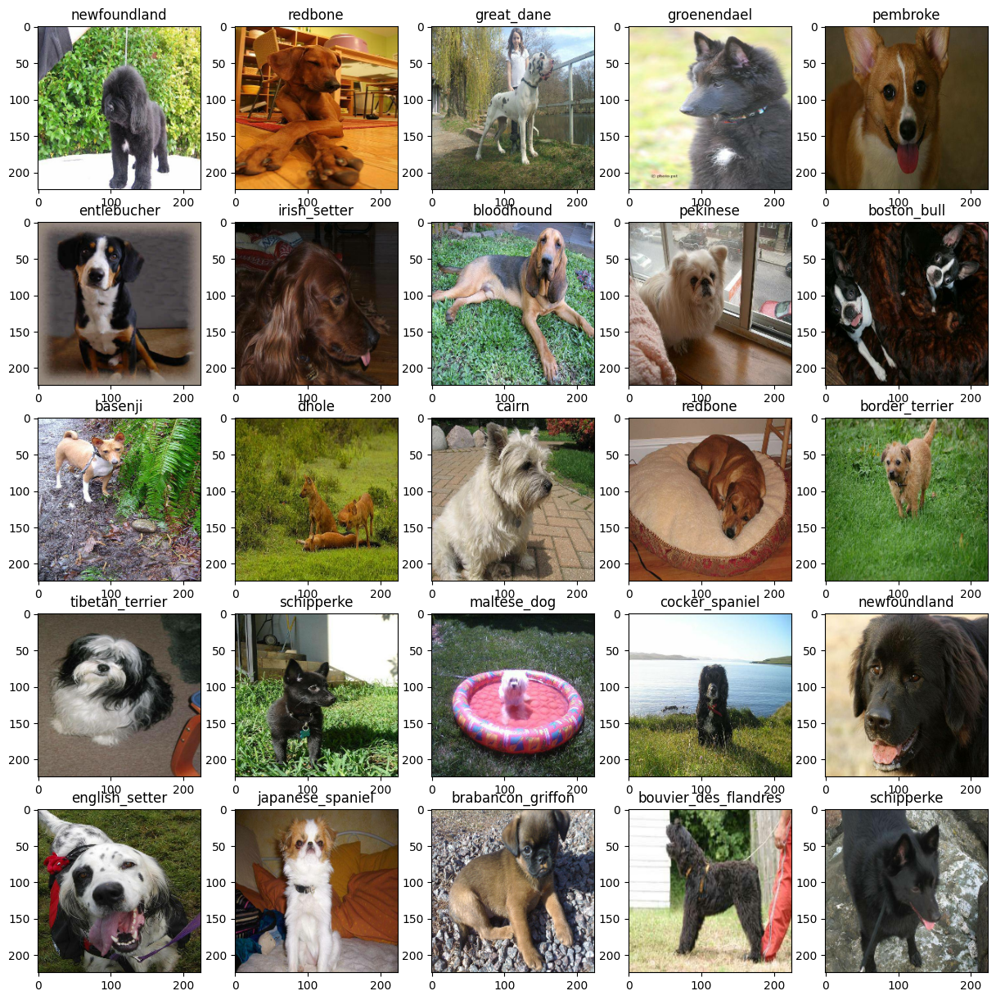

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
len(train_images), len(train_labels)

(32, 32)

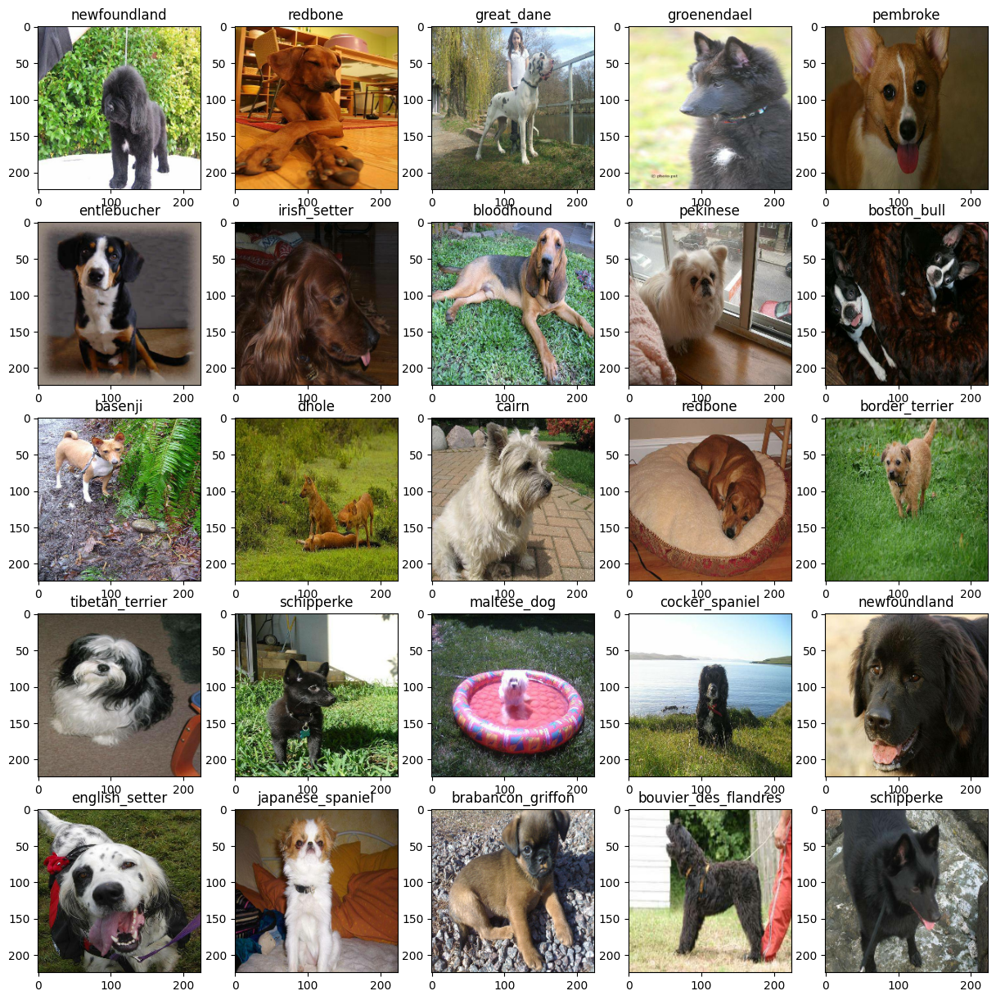

In [ ]:
#noe lets visulize the data in training batch
show_25_images(train_images,train_labels)

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
val_images, val_labels


(array([[[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.27701408, 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
 
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
 
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
 
         ...,
 
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.99153

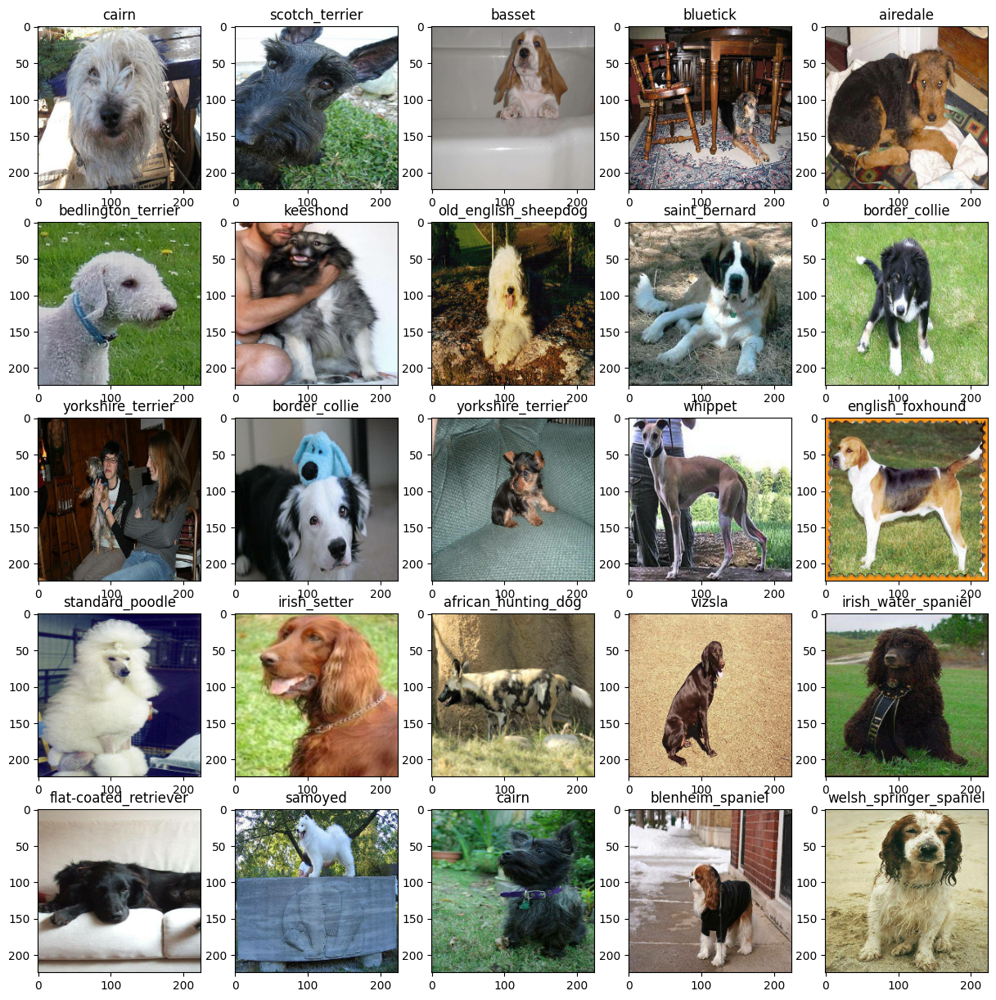

In [ ]:
show_25_images(val_images,val_labels )

## Building a model

Before we build model, there are few thing we need to define:

  * The input shape (our image shape, into the tensors) to our model.
  * The output shape (image labels, into the tensors) to oue model.
  * the URL of the model we want to use.
  * The link of thhe tensor flow model we use: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
IMG_SIZE

224

In [ ]:
#setup input shape of the model.
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3]# batch hight width color channel
#setup output shape of our model
OUTPUT_SHAPE =len(unique_breeds)

#setup model URL from tensor flow  hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we  haev got our input,output and model ready to go.Lets put them togeather into a keras deep learning model!

Knowing this lets create a function which:

* Take the input shape, output shape and the model we have chosen as parameter.
* Defune the layers in keras model in sequntial fashion(do this first, then this, than that).
* Compiles the model(says it should be exvaluting and improved).
* Build the model.(tells the model the input shape it will be getting).
* Return  the model.

All of this steps cann be found here:https://www.tensorflow.org/guide/keras/overview

In [ ]:
#create the function which build a keras model.
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("building model with:",MODEL_URL)

  #setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),#layer 1(input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")#layer 2(output layer)
  ])

  #compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## creating callbacks
callbacks are helper function a model can use during a training to do such things as save its progress chechk a model stop improving.

we will create two callbacks one for tensorBoard which help to track our models progress and another for each model from traning for too long.

### TensorBoard CallBack

### TO setup he callbacks we need to do the three things
1. Load the tensorboard NoteBook extension
2. Create a tensorFlow callbacks which is able to save logs to directory and pass it to our model's `fit()` function.
3. visualize our model training logs with the `%TensorBoard` magic function (we'll do this  after model).

In [ ]:
#Lode tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os
#create a function to build a tensorboard
def create_tensorboard_callbacks():
  #create a log directory for storing tensorboard logs
  logdir=os.path.join ("drive/My Drive/dog/logs2",
                       #make it so the logs get tracked whenever we run as experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stoping callbacks

Early stopping helps stop our model from overfitting by stopping traning if certain metrics  stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [ ]:
#create early stopping callbacks
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

# Traning a model (on subset of data)

Our first model is only going to  train 1000 images,to make sure every thing  is working.

In [ ]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}

In [ ]:
print("GPU","availabel(yes !!!!)" if tf.config.list_physical_devices("GPU")else "not availabel" )

GPU availabel(yes !!!!)


Lets create a function which trains a model.

* Create a model using `create_model()`
* Setup a tensorBoard callback using `create_tensorboard_callbacks()`.
* Call the `fit()` function on our model passing it the traning data,validation data,number of epochs to the train for
(`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model.


In [ ]:
#build the function to train and return a trained model
def train_model():
  """
  Train a given model and return the trained version.
  """
  #create a model
  model=create_model()

  #create new teensorboard session everytime we train a model
  tensorboard=create_tensorboard_callbacks()

  #fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #return the fitted model
  return model

In [ ]:
 #fit the
#model=train_model()

In [ ]:
import os
#print(os.scandir("drive/MyDrive/dog/train"))


### Cheaking the tensorboard logs
The tensorboard the magic function (`tenssorboad`)will access the logs directory we created earilar and visualize
it s contents

In [ ]:
%tensorboard --logdir drive/My\Drive/dog/logs2

<IPython.core.display.Javascript object>

## Making and evaluting the prediction using a train model


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#make a prediction a validation data
prediction=model.predict(val_data,verbose=1)
prediction


7/7 [==============================] - 35s 4s/step


array([[1.3306551e-03, 1.0713620e-02, 4.6777746e-04, ..., 3.2354291e-03,
        7.1917847e-03, 1.2248146e-03],
       [1.4960553e-02, 3.6234811e-03, 3.1766833e-03, ..., 3.2649762e-03,
        6.8490114e-03, 2.2879930e-03],
       [3.8535497e-03, 3.2136238e-03, 2.9772686e-02, ..., 4.1651681e-02,
        2.9327732e-04, 8.7220440e-05],
       ...,
       [6.6254335e-03, 2.2346962e-03, 7.4310426e-04, ..., 2.5687972e-02,
        3.8735472e-04, 6.6524296e-04],
       [4.0442226e-03, 5.0650104e-03, 3.2927934e-03, ..., 2.1569619e-02,
        5.3341724e-03, 2.3133753e-02],
       [4.8648391e-04, 5.1572421e-03, 1.7537754e-02, ..., 4.9400027e-04,
        4.1563544e-04, 1.4665822e-03]], dtype=float32)

In [ ]:
prediction.shape

(200, 120)

In [ ]:
len(prediction[0])

120

In [ ]:
len(y_val)

200

In [ ]:
prediction[0]

array([1.3306551e-03, 1.0713620e-02, 4.6777746e-04, 4.1813306e-03,
       1.5717880e-03, 5.4515909e-02, 1.8573276e-03, 1.9186366e-02,
       1.1454531e-02, 1.7497133e-03, 1.7637376e-02, 1.1118664e-02,
       6.7343831e-04, 3.3455060e-03, 1.0500548e-02, 2.6962573e-03,
       4.4108951e-03, 1.8925504e-03, 2.6764118e-03, 2.6994629e-03,
       3.4343607e-03, 1.7865334e-02, 5.2586156e-03, 2.9850632e-03,
       2.3805207e-05, 3.2462915e-03, 2.1174930e-03, 1.5948301e-02,
       6.1620085e-04, 1.8862245e-03, 9.2072859e-03, 3.2177893e-04,
       1.3232471e-03, 3.6009397e-02, 9.6358536e-03, 8.5375896e-03,
       1.5129686e-03, 2.5142380e-03, 1.6325328e-03, 7.7017810e-04,
       5.3585996e-03, 2.1162933e-02, 3.8320411e-02, 1.1394745e-03,
       4.6586129e-04, 2.1623706e-02, 2.1879100e-03, 9.1662006e-03,
       6.6104997e-04, 4.3927338e-03, 4.5053125e-03, 1.8313702e-02,
       3.8030511e-03, 8.7478347e-03, 9.9769719e-03, 3.4664165e-02,
       2.3944108e-03, 5.1513165e-03, 6.6732643e-03, 1.1973766e

In [ ]:
np.sum(prediction[0])

1.0

In [ ]:
np.sum(prediction[1])

1.0

In [ ]:
from operator import index
#first prediction
index=42
print(prediction[index])
print(f"Max value (probability of prediction):{np.max(prediction[index])}")
print(f"sum: {np.sum(prediction[index])}")
print(f"max index:{np.argmax(prediction[index])}")
print(f"prediction label:{unique_breeds[np.argmax(prediction[index])]}")



[0.03915123 0.00365095 0.00299674 0.00199782 0.00122659 0.00261344
 0.00782951 0.00767562 0.01391927 0.00957993 0.0024623  0.00881822
 0.00617198 0.00190237 0.02881474 0.00495084 0.00131685 0.00269086
 0.00940539 0.00133353 0.0033519  0.00264444 0.00182914 0.00182578
 0.00244991 0.00135235 0.0057548  0.00040982 0.0071417  0.01214849
 0.00674061 0.06079083 0.00381981 0.00049602 0.00099824 0.00103419
 0.0048136  0.00140627 0.00060941 0.00056307 0.00315735 0.00339591
 0.00180446 0.00673391 0.00320409 0.04145682 0.02772869 0.00368222
 0.04090547 0.00326957 0.00556805 0.0024339  0.00464759 0.01022342
 0.00398023 0.00129732 0.0015765  0.0070359  0.00632599 0.00109344
 0.0085244  0.01123991 0.00939437 0.01532364 0.00284264 0.00100138
 0.00511706 0.00529219 0.00256727 0.0062934  0.00168258 0.00113449
 0.00275769 0.00316072 0.00103074 0.00781829 0.01721766 0.00134107
 0.00560121 0.01362451 0.00119993 0.00850931 0.00133832 0.08667988
 0.00804492 0.01193024 0.00599776 0.02107151 0.00191096 0.0036

having the above functionality is greate but we want to bbe able to do scale.

and it would be even better if we could see the image the prediction is begin made on!

**Note:**Predicton probability are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(prediction[0])
pred_label

'saint_bernard'

Now since our validation data is still in batch dataset we will have to unbatchify it to make prediction on the validation images and then compare those prediction to the validation label(truth labels).

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_=[]
labels_=[]
#loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:
* prediction labels
* validation labels(truth labels)
* validation images

Let's make some function to make these all abit more visulize

we all create function which:
* Take an array of prediiction probabilities , an array of truth labels and an array of images and integrs.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probabilitiies ,the truth table and the target image on the singel plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

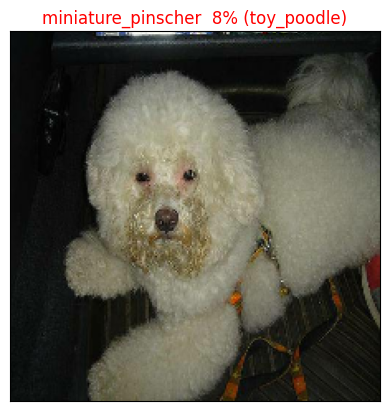

In [ ]:
plot_pred(prediction_probabilities=prediction,
          labels=val_labels,
          images=val_images,
          n=44)

Now we have some function to help us vislulize our preddiction and evaluate modellets check out the few model.

Let's build a function to demonstrate. The function will:

* Take an input of a prediction probabilities array, a ground truth   labels array and an integer.
Find the predicted label using get_pred_label().
Find the top 10:
Prediction probabilities indexes
Prediction probabilities values
Prediction labels
Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

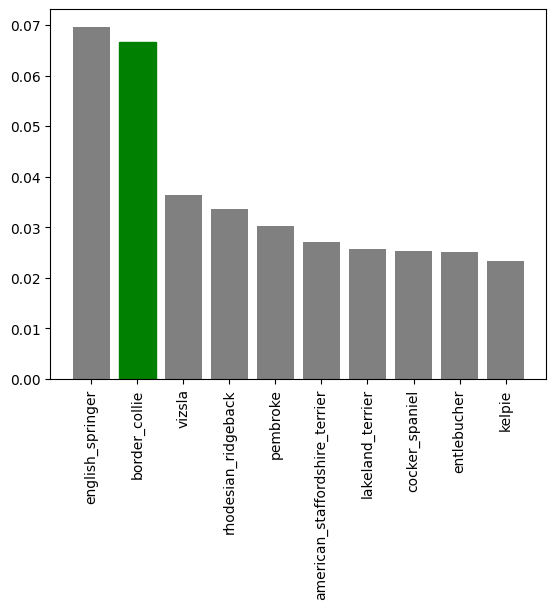

In [ ]:
plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=9)

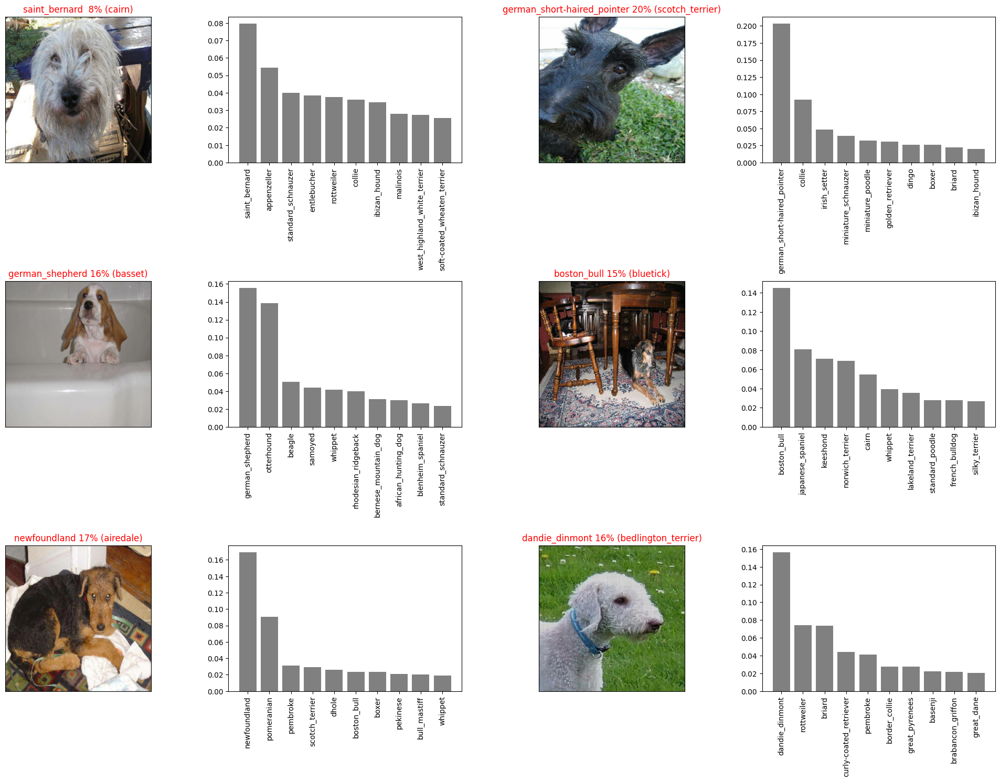

In [ ]:
#Lets chech out few prediction and their different values.
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=prediction,
            labels=val_labels,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloding a train model.


In [ ]:
#create a function to save a model.
def save_model(model,suffix=None):
  """
  Save a given model in model direcotry an append a suffix (string)
  """
  #create a model directory pathname with current time
  modeldir=os.path.join("drive/MyDrive/dog/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+"h5"#save formate of model
  print(f"save model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#create a function to load the train model
def load_model(model_path):
   """
   load save model from the spacified path
   """
   print(f"loading save model from : {model_path}")
   model=tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer":hub.KerasLayer})
   return model


In [ ]:
#save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

save model to: drive/MyDrive/dog/models/20231213-08001702454452-1000-images-mobilenetv2-Adamh5...


'drive/MyDrive/dog/models/20231213-08001702454452-1000-images-mobilenetv2-Adamh5'

In [ ]:
#evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 5.8080 - accuracy: 0.0050


[5.807971000671387, 0.004999999888241291]

In [ ]:
#evaluate the lodead model
loaded_1000_image_modle=load_model("drive/MyDrive/dog/models/20230712-06571689145040-1000-images-mobilenetv2-Adamh5")

loading save model from : drive/MyDrive/dog/models/20230712-06571689145040-1000-images-mobilenetv2-Adamh5


In [ ]:
loaded_1000_image_modle.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.1543 - accuracy: 0.6900


[1.1542856693267822, 0.6899999976158142]

## Traning a big dog model(full dataset)

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
#create a databatch with the full dataset
full_data=create_batch_data(x,y)

creating traning data set


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
#create a full model callback
full_model_tensorboard=create_tensorboard_callbacks()
#no validation set when traning on all the data, so we can't moniter validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

**NOTE:** Running the below cell will take the time(more than 1 hour)

In [ ]:
#fit the full model to the full data
#full_model.fit(x=full_data,
 #              epochs=NUM_EPOCHS,
  #             callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model,suffix="full-image-mobilenetv2-Adam")

save model to: drive/MyDrive/dog/models/20231213-08011702454472-full-image-mobilenetv2-Adamh5...


'drive/MyDrive/dog/models/20231213-08011702454472-full-image-mobilenetv2-Adamh5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/dog/models/20230712-12181689164286-full-image-mobilenetv2=Adamh5")

loading save model from : drive/MyDrive/dog/models/20230712-12181689164286-full-image-mobilenetv2=Adamh5


l

## Make prediction on test dataset

Since our model has been trained on images on the form of tensors batches,to make predictions on the test data, we 'll
have to et it into the same format.

Luckily we created`create_data_batches()` earlier which can take a list filenames as input and conver them into tensor batches.

To make predictions on the test data we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using 'create_data_batches()`and settin the `test_data` parameter to `True` (since the test data dosent have label)
* Make prediction array by passing the test batches to the `predict()` methods calles on our model.



In [ ]:
#Lode test images filenames
test_path="drive/MyDrive/dog/test/"
test_filenames=[test_path + fname  for fname  in os.listdir(test_path)]
test_filenames[:10]


['drive/MyDrive/dog/test/e9d385cf5f217ce1378bee8c0a89db62.jpg',
 'drive/MyDrive/dog/test/f2b7d11ea6ccf65f214cac2abee8d1a1.jpg',
 'drive/MyDrive/dog/test/e8b49a4b2c22d3c5cb3c88c61654e991.jpg',
 'drive/MyDrive/dog/test/f18141846c17b423f3f1df37ef294138.jpg',
 'drive/MyDrive/dog/test/e83f4c0ff6dec86d89d0f8b70ecd3cea.jpg',
 'drive/MyDrive/dog/test/f3b603f10d6a344f0395fb46b242ff8e.jpg',
 'drive/MyDrive/dog/test/f00272c001d09c7c306bb224da47f17a.jpg',
 'drive/MyDrive/dog/test/ef58b740df67a98d390f5bf8513bcea5.jpg',
 'drive/MyDrive/dog/test/ecc4566304626790004cd2c3626218b6.jpg',
 'drive/MyDrive/dog/test/f596d629c90c70820c38a094f03be387.jpg']

In [ ]:
len(test_filenames)

10332

In [ ]:
#creaet test data batches
test_data=create_batch_data(test_filenames,test_data=True)

creating test data batches...!


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**note:** calling the predict() in our full model and passing in the test data batches will take a long time to run


In [ ]:
#Make prediction on test data batch using the loaded full model
test_prediction=loaded_full_model.predict(test_data,
                                          verbose=1)

323/323 [==============================] - 184s 551ms/step


In [ ]:
#save the prediction (NUmpy array) to save csv files(foe access later)
np.savetxt("drive/MyDrive/dog/pred_array.csv",test_prediction,delimiter=",")


In [ ]:
#save the prediction (NUmpy array)from csv file
test_prediction=np.loadtxt("drive/MyDrive/dog/pred_array.csv",delimiter=",")

## Preparing the test data set for kaggel
 Looking at the kaggel sample submission,we find that it want prediction probability outputs in a DataFrame with an ID ans columns for each different dog breed."https://www.kaggle.com/c/gog-breed-identification/overview/evaluation"

 To get the data in the format, we will
 * create a pandas DataFrame an ID columns as well as columns for each dog breed.
 * Add data to the ID columns by extracting the test images ID's from their filepath.
 * Add data(The prediction probabilities)to each of the dog breed columns.
 * Export teh DataFrame as the CSV to submit it to kaggel.



In [ ]:
#create the pandas dataframe with empty columns
pred_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
#append the test images ID's tompredictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
pred_df["id"]=test_ids

In [ ]:
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9d385cf5f217ce1378bee8c0a89db62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f2b7d11ea6ccf65f214cac2abee8d1a1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e8b49a4b2c22d3c5cb3c88c61654e991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f18141846c17b423f3f1df37ef294138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e83f4c0ff6dec86d89d0f8b70ecd3cea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#add the prediction probabilities to each dog breed columns
pred_df[list(unique_breeds)]=test_prediction
pred_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e9d385cf5f217ce1378bee8c0a89db62,7.373413e-09,5.436551e-07,4.137091e-08,9.616141e-05,4.851743e-07,3.079634e-06,4.353796e-09,2.264515e-11,4.413701e-07,...,7.751167e-10,1.217275e-09,4.197086e-06,5.525909e-05,1.374999e-05,1.629691e-08,4.208701e-10,8.292836e-10,3.674770e-09,2.272116e-06
1,f2b7d11ea6ccf65f214cac2abee8d1a1,2.943908e-10,2.643237e-08,1.446184e-10,2.788131e-07,3.347616e-08,2.603954e-03,1.648265e-09,7.794370e-09,1.999349e-08,...,4.445158e-09,6.479461e-12,1.603210e-08,3.263629e-06,1.014176e-08,1.925013e-07,3.846664e-08,4.103656e-09,2.931206e-10,4.402603e-10
2,e8b49a4b2c22d3c5cb3c88c61654e991,2.825590e-08,3.485704e-07,1.074530e-09,1.520937e-08,7.114974e-09,3.316548e-09,1.265280e-09,7.482361e-08,1.694510e-08,...,3.121593e-07,1.117686e-09,8.038517e-10,8.815653e-08,1.995747e-07,2.622019e-09,1.535159e-09,1.605899e-07,7.779426e-09,1.161350e-09
3,f18141846c17b423f3f1df37ef294138,5.504195e-10,1.671833e-11,2.346632e-10,1.805561e-10,4.377268e-06,4.604987e-07,1.419090e-08,9.997376e-01,2.080549e-07,...,2.863428e-08,1.707653e-07,9.308469e-09,5.927734e-09,2.645378e-10,7.935110e-08,1.237047e-08,1.566876e-08,1.118460e-07,6.740499e-10
4,e83f4c0ff6dec86d89d0f8b70ecd3cea,9.422444e-10,1.133250e-08,1.524886e-10,4.148886e-07,1.042310e-05,5.396895e-06,2.656385e-06,8.249511e-05,6.395278e-09,...,3.490164e-08,4.151023e-07,1.738420e-08,1.118574e-06,3.980003e-09,9.959554e-05,6.739960e-09,1.417326e-06,1.360427e-06,7.838044e-07


In [ ]:
#Save our prediction dataframe to csv ffor submission to kaggel
pred_df.to_csv("drive/MyDrive/dog/full_model_predictions_submission_1_mobilenetV2.csv",
               index=False)

In [ ]:
len(pred_df)

10332